In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch

In [146]:
def crop_center_numpy(image, target_size=(256, 256)):
    h, w = image.shape[:2]
    target_h, target_w = target_size
    
    # Calculate the starting and ending indices for cropping
    start_h = (h - target_h) // 2
    start_w = (w - target_w) // 2
    end_h = start_h + target_h
    end_w = start_w + target_w
    
    # Crop the image
    cropped_image = image[start_h:end_h, start_w:end_w]
    
    return cropped_image

## C

In [1]:
from data import get_data
from kspace_sampling import get_samples, initialize_2D_cartesian
from physic import corrupt
from model import get_model, FISTA
from plots import plot_rec, plot_img
from mrinufft.trajectories.display import display_2D_trajectory

import numpy as np
import matplotlib.pyplot as plt
import torch

%load_ext autoreload
%autoreload 2


/volatile/BL/fastmri/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [172]:
# image = get_data(idx = 0)
image = np.load('brainweb_2d_192.npy')
# image = crop_center_numpy(image)

<Axes: xlabel='kx', ylabel='ky'>

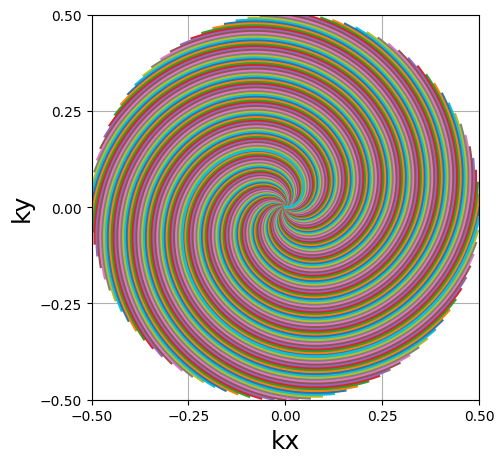

In [175]:
# samples_loc = get_sparkling()
choice = 3
traj = ['sparkling', 'cartesian', 'radial', 'spiral', 'cones', 'sinusoide', 'propeller', 'rings', 'rosette', 'polar_lissajous', 'lissajous', 'waves']


samples_loc = get_samples(traj[choice], Nc = 100, Ns = 1000)
display_2D_trajectory(samples_loc)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


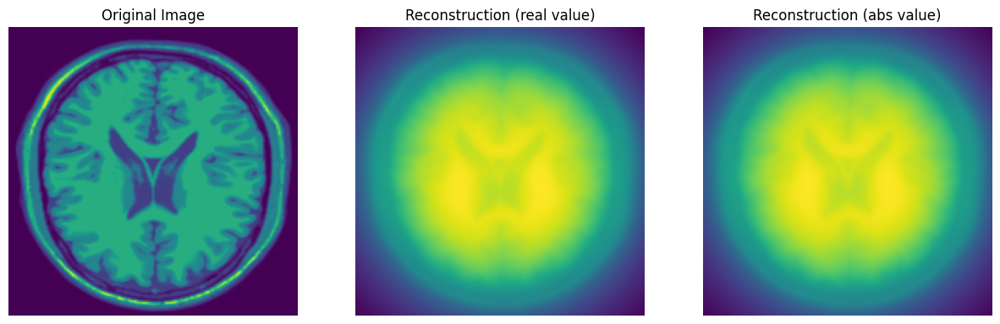

In [176]:
x, y, back = corrupt(image, samples_loc)
plot_img(x, back)

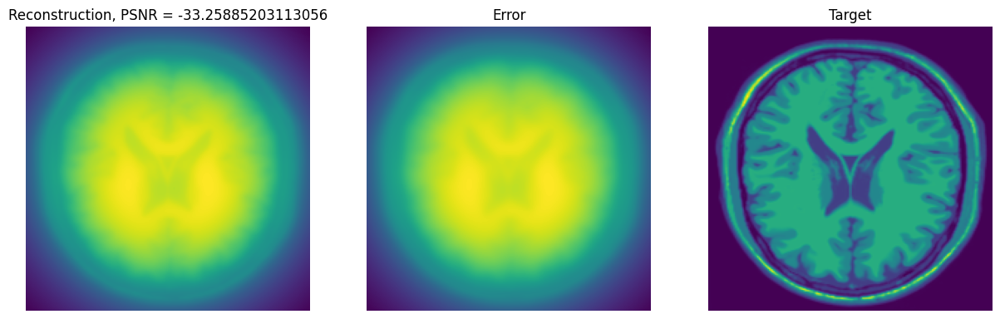

In [177]:
plot_rec(x, back)

In [178]:
algo, physics = get_model(image, samples_loc, max_iter = 20, sigma = 0.01)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


In [ ]:
with torch.no_grad():
    x_hat = algo(y, physics)

 75%|████████████████████████████████▎          | 15/20 [00:18<00:05,  1.20s/it]

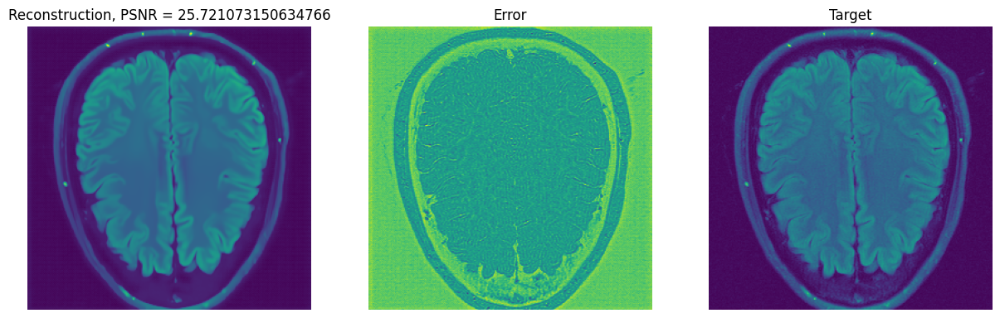

In [158]:
plot_rec(x, x_hat)

In [159]:
x_hat_fista = FISTA(image, samples_loc)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
Iteration 99, criterion = 0.0089: 100%|███████| 100/100 [00:08<00:00, 11.15it/s]


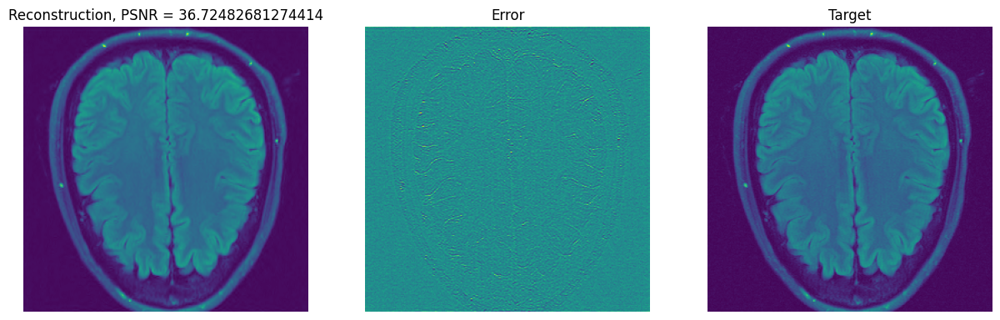

In [160]:
plot_rec(x, x_hat_fista)

In [168]:
#### func global 

def run_experiment(choice, idx, Fista = False):
    
    image = get_data(idx = idx)
    samples_loc = get_samples(traj[choice], Nc = 100, Ns = 1000)
    x, y, back = corrupt(image, samples_loc)
    plot_img(x, back)
    algo, physics = get_model(image, samples_loc, max_iter = 20, sigma = 0.01)
    with torch.no_grad():
        x_hat = algo(y, physics)
    plot_rec(x, x_hat)
    if Fista:
        x_hat_fista = FISTA(image, samples_loc)
        plot_rec(x, x_hat_fista)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


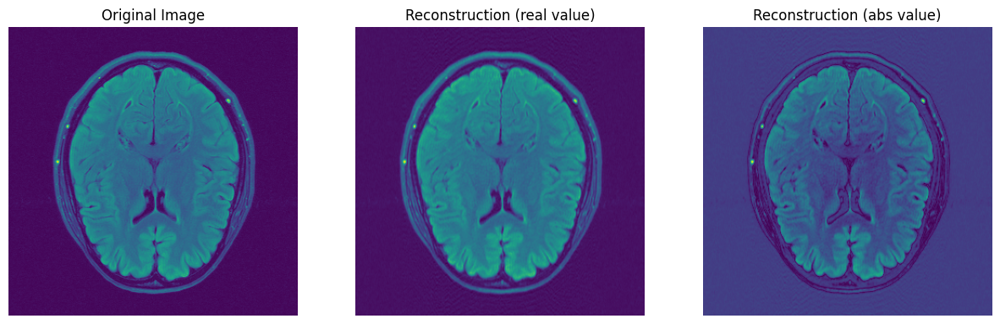

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
100%|███████████████████████████████████████████| 20/20 [00:32<00:00,  1.65s/it]


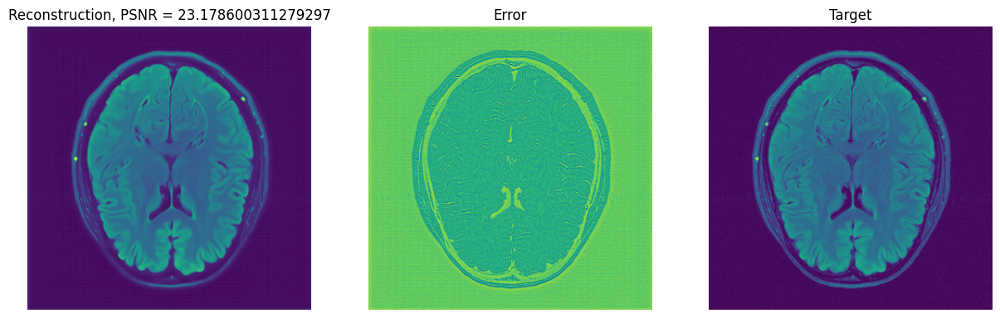

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
Iteration 99, criterion = 0.0179: 100%|███████| 100/100 [00:06<00:00, 15.00it/s]


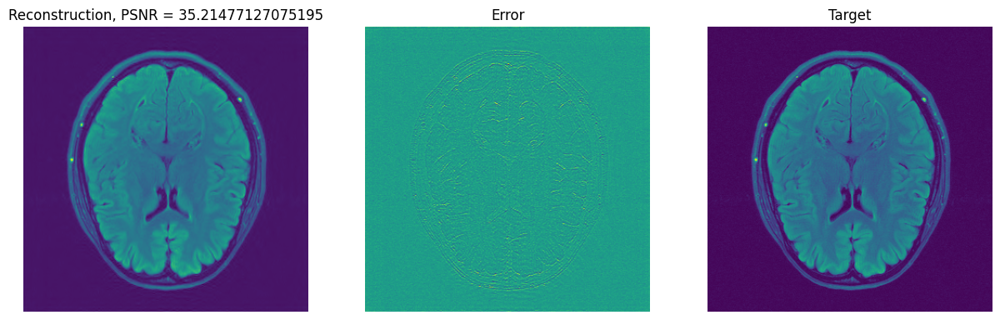

In [165]:
# cartesian 
run_experiment(1,0,True)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


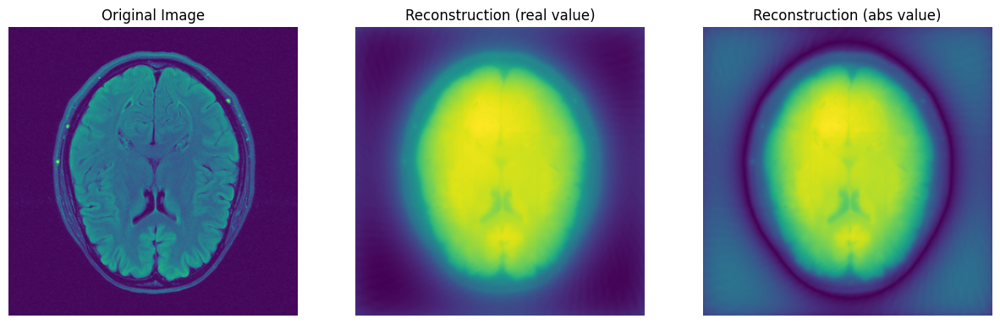

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
100%|███████████████████████████████████████████| 20/20 [00:48<00:00,  2.42s/it]


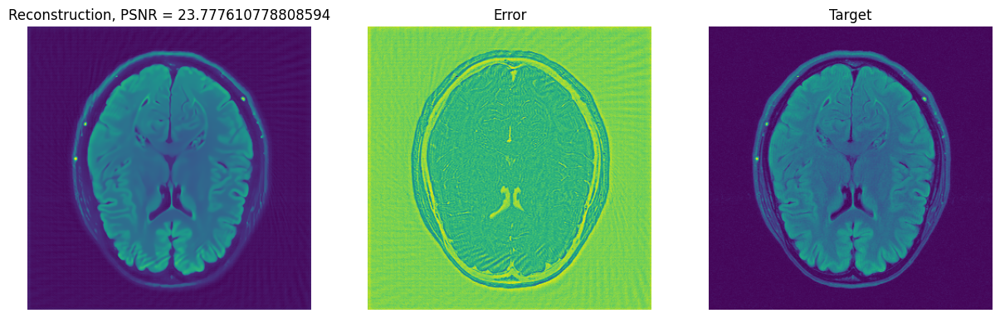

In [166]:
# spiral
run_experiment(3,0,False)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


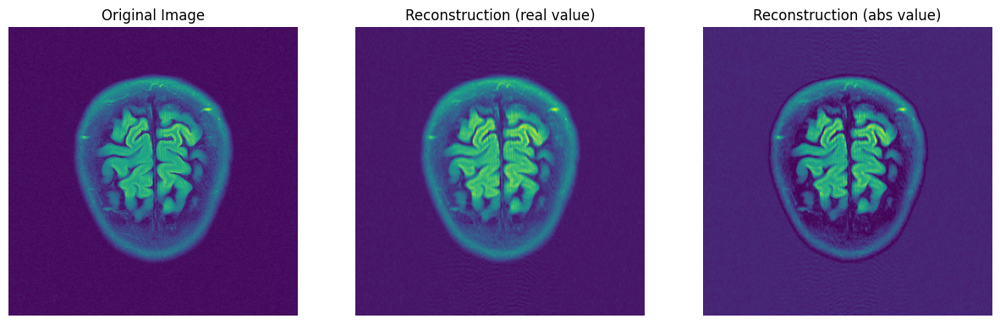

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
100%|███████████████████████████████████████████| 20/20 [00:29<00:00,  1.48s/it]


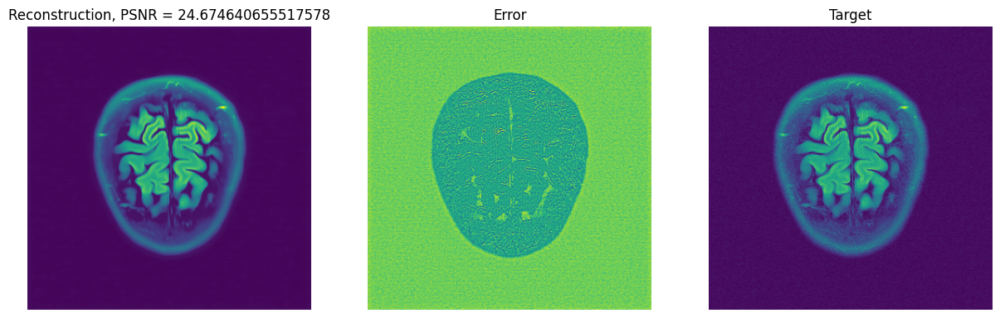

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
Iteration 99, criterion = 0.0199: 100%|███████| 100/100 [00:06<00:00, 14.74it/s]


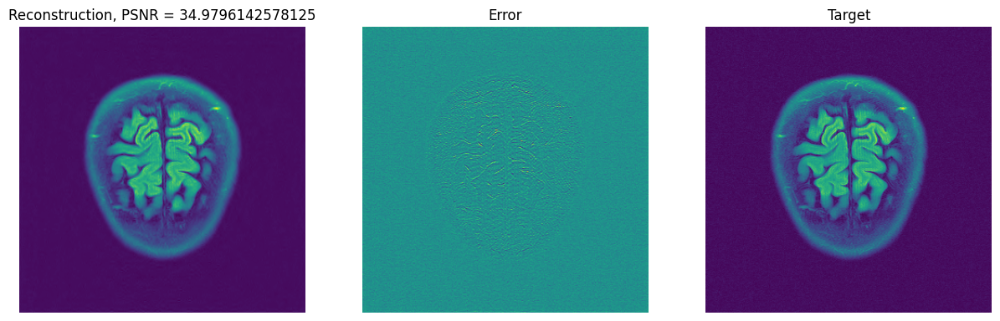

In [169]:
# cartesian 
run_experiment(1,10,True)

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


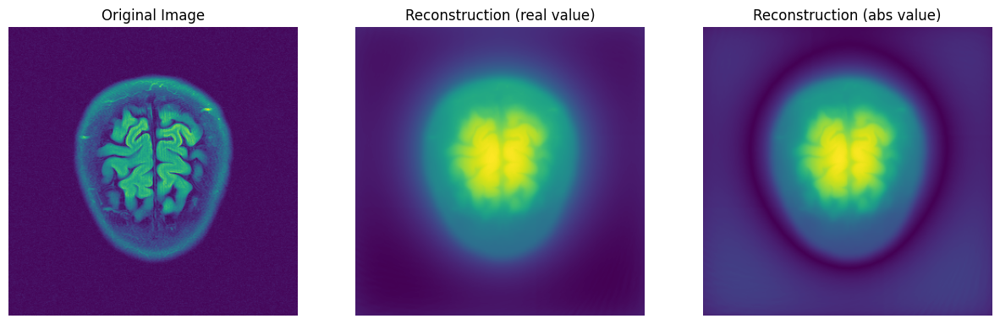

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(
100%|███████████████████████████████████████████| 20/20 [00:48<00:00,  2.43s/it]


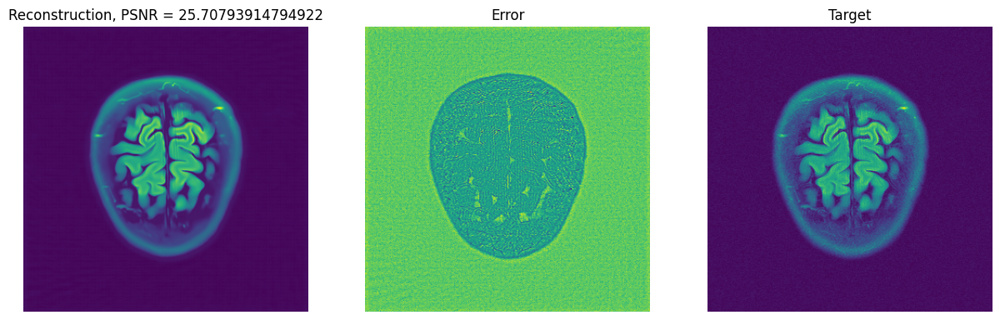

In [170]:
# spiral
run_experiment(3,10,False)

# Trash

In [84]:
from fastmri.data import subsample
from fastmri.data import transforms, mri_data

# Create a mask function
mask_func = subsample.RandomMaskFunc(
    center_fractions=[0.08, 0.04],
    accelerations=[4, 8]
)


## Real 

In [22]:
import fastmri

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import torch

from fastmri.data import SliceDataset

#help(SliceDataset)

import pathlib
from fastmri.data import subsample
from fastmri.data import transforms, mri_data
import fastmri.data.transforms as T

path = '/neurospin/optimed/BenjaminLapostolle/fast-mri_smal/'

In [24]:
data_transform = T.UnetDataTransform(which_challenge="multicoil")

dataset = mri_data.SliceDataset(
    root=pathlib.Path(path),
    #root=pathlib.Path('./fast-mri_smal'),
    transform=data_transform,
    challenge='multicoil'
)

In [25]:
dataloader = torch.utils.data.DataLoader(dataset)

In [26]:
idx = 0
# for batch in dataloader:
for batch in dataloader:
    data = batch
    image, reconstruction, mean, std, fname, slice_num, _ = batch
    print(fname, slice_num)
    if idx == 0:
        break
    idx += 1

('file_brain_AXFLAIR_200_6002425.h5',) tensor([0])


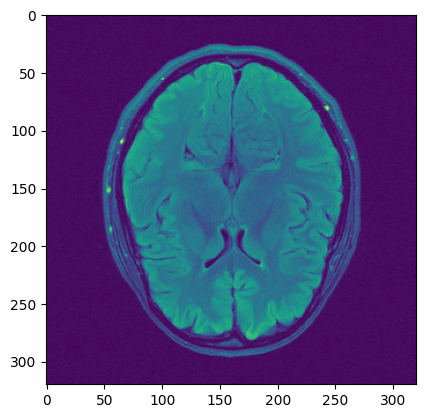

In [27]:
plt.imshow(reconstruction[0])

In [28]:
import mrinufft
from mrinufft.trajectories import display

NufftOperator = mrinufft.get_operator("finufft")

In [29]:
import torch
from deepinv.physics import LinearPhysics
from mrinufft.density.geometry_based import voronoi

class Nufft(LinearPhysics):
    """
    We can implement our own custom autograd Functions by subclassing
    torch.autograd.Function and implementing the forward and backward passes
    which operate on Tensors.
    """

    def __init__(
        self,
        img_size,
        samples_loc,
        density=None,
        real=False,
        **kwargs
    ):
        super(Nufft, self).__init__(**kwargs)
        
        self.real = real  # Whether to project the data on real images
        if density is not None:
            if density == 'voronoi':
                density = voronoi(samples_loc.reshape(-1, 2))
        
        self.nufft = NufftOperator(samples_loc.reshape(-1, 2), shape=img_size, density=density, n_coils=1, squeeze_dims=False)

    def A(self, x):
        return self.nufft.op(x)

    def A_adjoint(self, kspace):
        return self.nufft.adj_op(kspace)

In [30]:
from mrinufft import get_density, get_operator, check_backend
from mrinufft.trajectories import initialize_2D_radial
from mrinufft.io.nsp import read_trajectory
from mrinufft.trajectories.display import display_2D_trajectory
import matplotlib.pyplot as plt 
import numpy as np 

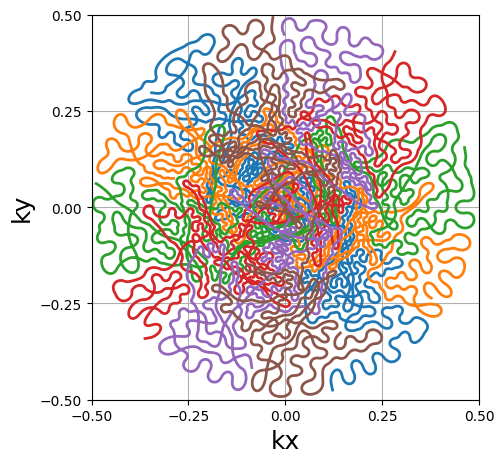

In [31]:
traj, params = read_trajectory("sparkling_2d")
traj *= 2   # The above trajectory is in [-0.25, 0.25] but we want it in [-0.5, 0.5]
display_2D_trajectory(traj)
traj = traj.astype(np.float32)

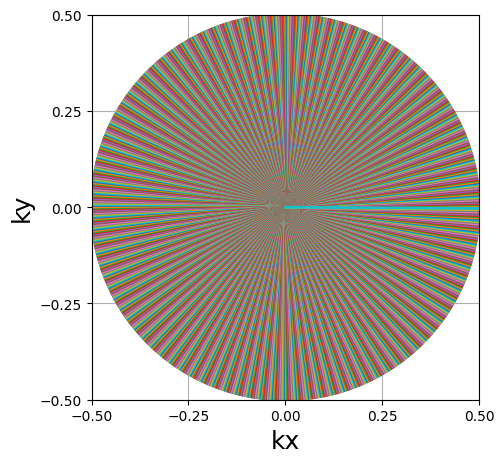

In [150]:
traj = initialize_2D_radial(1000, 1000)
display_2D_trajectory(traj)
traj = traj.astype(np.float32)

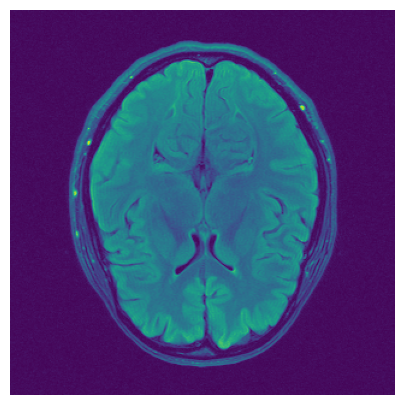

In [32]:
# image = np.load('brainweb_2d_192.npy')
image = reconstruction.clone()[0].numpy()

plt.figure(figsize=(5,5))
plt.imshow(image)
plt.axis(False)
plt.show()

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


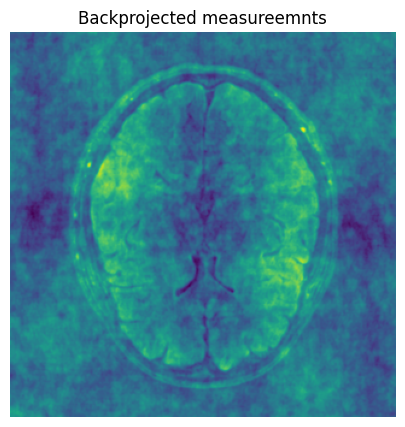

In [33]:
image_torch = torch.from_numpy(image).unsqueeze(0).unsqueeze(0)
x = image_torch.clone()
x = x/x.abs().max()

# Create a 2D Radial trajectory
samples_loc = traj.copy()

# Generate the physics
physics = Nufft(image_torch[0, 0].shape, samples_loc, density=None)
y = physics.A(x)
back = physics.A_adjoint(y)

plt.figure(figsize=(10, 5))
plt.imshow(torch.real(back).squeeze())
plt.axis(False)
plt.title('Backprojected measureemnts')
plt.show()

In [41]:
physics.A(x).shape

torch.Size([1, 1, 16128])

In [34]:
class ComplexDenoiser(torch.nn.Module):
    def __init__(self, denoiser):
        super().__init__()
        self.denoiser = denoiser

    def forward(self, x, sigma):
        noisy_batch = torch.cat((x.real, x.imag), 0)
        denoised_batch = self.denoiser(noisy_batch, sigma)
        denoised = denoised_batch[0:1, ...]+1j*denoised_batch[1:2, ...]
        return denoised

In [35]:
from deepinv.optim.data_fidelity import L2
from deepinv.optim import optim_builder, PnP
from deepinv.models import DRUNet

# Generate the physics
physics = Nufft(image_torch[0, 0].shape, samples_loc, density=None, real=False)
y = physics.A(x)
back = physics.A_adjoint(y)

# Load PnP denoiser backbone
model = DRUNet(in_channels=1, out_channels=1, pretrained='download')
model.eval()
model = ComplexDenoiser(model)


# Compute the sequence of parameters along iterates
def get_DPIR_params(noise_level_img, max_iter=8):
    r"""
    Default parameters for the DPIR Plug-and-Play algorithm.

    :param float noise_level_img: Noise level of the input image.
    """
    s1 = 49.0 / 255.0
    s2 = noise_level_img
    sigma_denoiser = np.logspace(np.log10(s1), np.log10(s2), max_iter).astype(
        np.float32
    )
    stepsize = (sigma_denoiser / max(0.01, noise_level_img)) ** 2
    lamb = 1 / 0.23
    return lamb, list(sigma_denoiser), list(stepsize), max_iter


# Set the DPIR algorithm parameters
sigma = 0.005  # Noise level in the image domain
max_iter = 30  # Max number of iterations
lamb, sigma_denoiser, stepsize, max_iter = get_DPIR_params(sigma, max_iter=max_iter)
params_algo = {"stepsize": stepsize, "g_param": sigma_denoiser, "lambda": lamb}
early_stop = False  # Do not stop algorithm with convergence criteria

# Select the data fidelity term
data_fidelity = L2()

# Specify the denoising prior
prior = PnP(denoiser=model)

# instantiate the algorithm class to solve the IP problem.
algo = optim_builder(
    iteration="HQS",
    prior=prior,
    data_fidelity=data_fidelity,
    early_stop=early_stop,
    max_iter=max_iter,
    verbose=True,
    params_algo=params_algo,
)


/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


In [55]:
with torch.no_grad():
    x_hat = algo(y, physics)

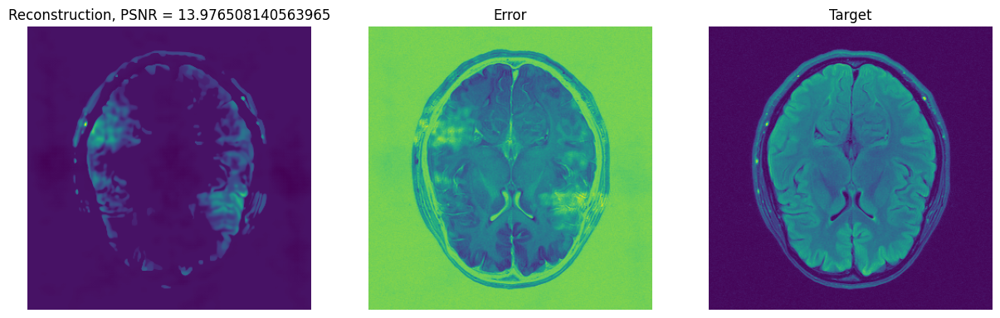

In [56]:
from deepinv.utils.metric import cal_psnr

# Compute reconstruction metric
psnr = cal_psnr(x.abs(), x_hat.abs()).item()

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(np.real(x_hat).squeeze(), cmap='viridis')
plt.title('Reconstruction, PSNR = ' + str(psnr))
plt.axis('off')
plt.subplot(132)
plt.imshow(np.real(x_hat-x).squeeze(), cmap='viridis')
plt.title('Error')
plt.axis('off')
plt.subplot(133)
plt.imshow(np.real(x).squeeze(), cmap='viridis')
plt.title('Target')
plt.axis('off')
plt.show()

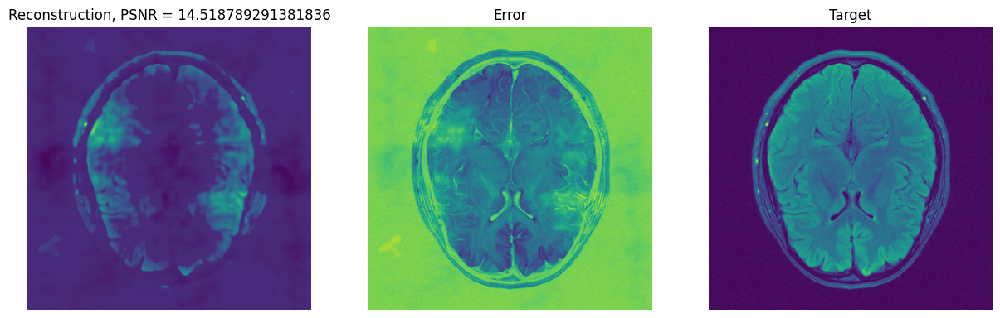

In [30]:
from deepinv.utils.metric import cal_psnr

# Compute reconstruction metric
psnr = cal_psnr(x.abs(), x_hat.abs()).item()

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(np.real(x_hat).squeeze(), cmap='viridis')
plt.title('Reconstruction, PSNR = ' + str(psnr))
plt.axis('off')
plt.subplot(132)
plt.imshow(np.real(x_hat-x).squeeze(), cmap='viridis')
plt.title('Error')
plt.axis('off')
plt.subplot(133)
plt.imshow(np.real(x).squeeze(), cmap='viridis')
plt.title('Target')
plt.axis('off')
plt.show()

## Data

2020 fastMRI challenge: multi-coil track

In [117]:
# import h5py

# #path = './fast-mri_smal/file_brain_AXFLAIR_200_6002425.h5'
# # Open the HDF5 file
# with h5py.File(path, 'r') as file:
#     # Access the dataset
#     a = file 

#     # dataset = file['dataset_name']
    
#     # # Read data from the dataset
#     # data = dataset[:]
    
#     # # Now you can work with the data as needed
#     # print(data)


In [118]:
from fastmri.data import SliceDataset


In [119]:
#help(SliceDataset)

import pathlib
from fastmri.data import subsample
from fastmri.data import transforms, mri_data
import fastmri.data.transforms as T


In [120]:
data_transform = T.UnetDataTransform(which_challenge="multicoil")

In [25]:
dataset = mri_data.SliceDataset(
    root=pathlib.Path(path),
    #root=pathlib.Path('./fast-mri_smal'),
    transform=data_transform,
    challenge='multicoil'
)

In [121]:
dataset_no_transform = mri_data.SliceDataset(
    root=pathlib.Path(path),
    #root=pathlib.Path('./fast-mri_smal'),
    # transform=data_transform,
    challenge='multicoil'
)

In [26]:
dataloader = torch.utils.data.DataLoader(dataset)

In [122]:
dataloader_no_transform = torch.utils.data.DataLoader(dataset_no_transform)

In [27]:
idx = 0
# for batch in dataloader:
for batch in dataloader:
    data = batch
    image, reconstruction, mean, std, fname, slice_num, _ = batch
    print(fname, slice_num)
    if idx == 0:
        break
    idx += 1

AttributeError: module 'fastmri' has no attribute 'ifft2c'

In [127]:
for data in dataset_no_transform:
    y = data
    break

In [96]:
image.shape, reconstruction.shape

(torch.Size([1, 320, 320]), torch.Size([1, 320, 320]))

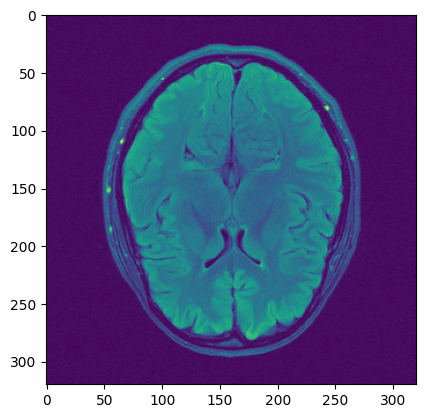

In [12]:
plt.imshow(image[0])

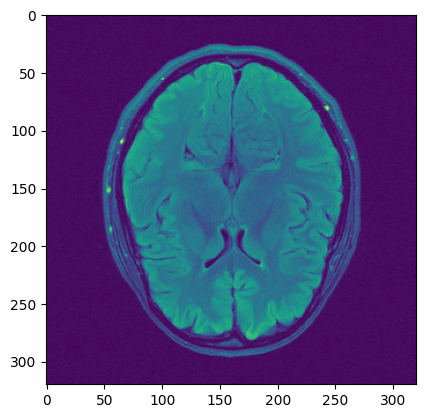

In [13]:
plt.imshow(reconstruction[0])

In [22]:
torch.sum((image[0] - reconstruction[0])**2)

tensor(1.3459e-09)

In [17]:
image[0].shape, reconstruction[0].shape

(torch.Size([320, 320]), torch.Size([320, 320]))

In [128]:
y[3], y[4], y[5]

({'acquisition': 'AXFLAIR',
  'max': 0.0004274357358916608,
  'norm': 0.09131797120370877,
  'patient_id': 'dcfc3e70496246a709dab23831262b60589f4383d6e05bf5559731ea8d80bb1f',
  'padding_left': 48,
  'padding_right': 272,
  'encoding_size': (640, 320, 1),
  'recon_size': (320, 320, 1)},
 'file_brain_AXFLAIR_200_6002425.h5',
 0)

/tmp/ipykernel_1205654/1540885085.py:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(y[0][12])))


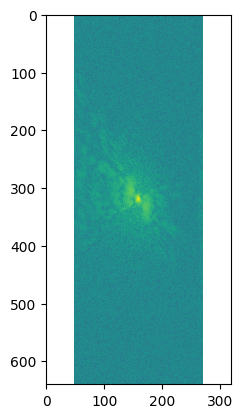

In [129]:
plt.imshow(np.log(np.abs(y[0][12])))

In [28]:
import pdb

In [95]:
##### draft of the code to reconstruct images using 2D images

import pathlib
import fastmri

from fastmri.data import subsample
from fastmri.data import transforms, mri_data

# Create a mask function
mask_func = subsample.RandomMaskFunc(
    center_fractions=[0.08, 0.04],
    accelerations=[4, 8]
)

def data_transform(kspace, mask, target, data_attributes, filename, slice_num):
    
    # Transform the data into appropriate format
    # Here we simply mask the k-space and return the result
    kspace = transforms.to_tensor(kspace)
    masked_kspace, mask, num_low_freq = transforms.apply_mask(kspace, mask_func)
    #pdb.set_trace()

    image = fastmri.ifft2c(masked_kspace)
    # crop input to correct size
    if target is not None:import h5py

        crop_size = (target.shape[-2], target.shape[-1])
    else:
        crop_size = (attrs["recon_size"][0], attrs["recon_size"][1])

    if image.shape[-2] < crop_size[1]:
            crop_size = (image.shape[-2], image.shape[-2])

    image = transforms.complex_center_crop(image, crop_size)

    # absolute value
    image = fastmri.complex_abs(image)
    image = fastmri.rss(image)
    
    image, mean, std = transforms.normalize_instance(image, eps=1e-11)
    image = image.clamp(-6, 6)

    if target is not None:
        target_torch = transforms.to_tensor(target)
        target_torch = transforms.center_crop(target_torch, crop_size)
        target_torch = transforms.normalize(target_torch, mean, std, eps=1e-11)
        target_torch = target_torch.clamp(-6, 6)
    else:
        target_torch = transforms.torch.Tensor([0])
            
    # return masked_kspace
    return image, mask, kspace, masked_kspace

dataset = mri_data.SliceDataset(
    root=pathlib.Path(path),
    transform=data_transform,
    challenge='multicoil'
)

#for masked_kspace in dataset:
    # Do reconstruction
#    pass 

In [96]:
dataloader = torch.utils.data.DataLoader(dataset)

In [107]:
kspace.shape

torch.Size([1, 20, 640, 320, 2])

In [144]:
coil = 1

/tmp/ipykernel_1205654/3137355330.py:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.sqrt(masked_kspace[0,coil,:,:,0]**2 + masked_kspace[0,coil,:,:,1]**2)))


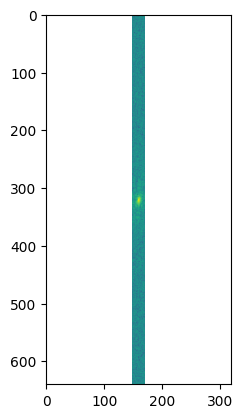

In [145]:
plt.imshow(np.log(np.sqrt(masked_kspace[0,coil,:,:,0]**2 + masked_kspace[0,coil,:,:,1]**2)))

/tmp/ipykernel_1205654/3246062703.py:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.sqrt(kspace[0,coil,:,:,0]**2 + kspace[0,coil,:,:,1]**2)))


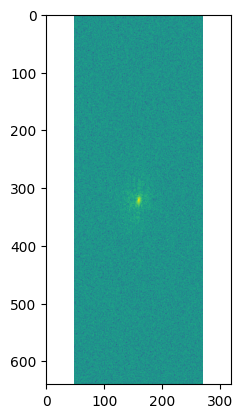

In [146]:
plt.imshow(np.log(np.sqrt(kspace[0,coil,:,:,0]**2 + kspace[0,coil,:,:,1]**2)))

In [100]:
mask.shape, kspace.shape, masked_kspace.shape

(torch.Size([1, 1, 1, 320, 1]),
 torch.Size([1, 20, 640, 320, 2]),
 torch.Size([1, 20, 640, 320, 2]))

In [98]:
idx = 0
# for batch in dataloader:
for batch in dataloader:
    #data = batch
    image, mask, kspace, masked_kspace = batch
    #print(y1,y2,y3)
    if idx == 0:
        break
    idx += 1

In [90]:
image.shape

torch.Size([1, 320, 320])

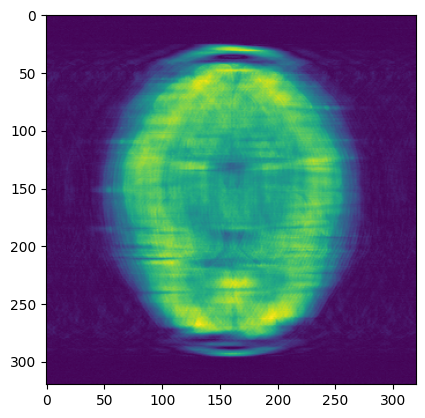

In [88]:
plt.imshow(image[0])

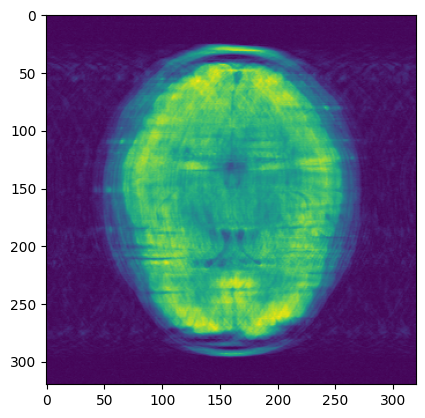

In [49]:
plt.imshow(image[0])

## Using mri-nufft

In [2]:
import mrinufft
from mrinufft.trajectories import display

NufftOperator = mrinufft.get_operator("finufft")

In [3]:
import torch
from deepinv.physics import LinearPhysics
from mrinufft.density.geometry_based import voronoi

class Nufft(LinearPhysics):
    """
    We can implement our own custom autograd Functions by subclassing
    torch.autograd.Function and implementing the forward and backward passes
    which operate on Tensors.
    """

    def __init__(
        self,
        img_size,
        samples_loc,
        density=None,
        real=False,
        **kwargs
    ):
        super(Nufft, self).__init__(**kwargs)
        
        self.real = real  # Whether to project the data on real images
        if density is not None:
            if density == 'voronoi':
                density = voronoi(samples_loc.reshape(-1, 2))
        
        self.nufft = NufftOperator(samples_loc.reshape(-1, 2), shape=img_size, density=density, n_coils=1, squeeze_dims=False)

    def A(self, x):
        return self.nufft.op(x)

    def A_adjoint(self, kspace):
        return self.nufft.adj_op(kspace)

In [4]:
from mrinufft import get_density, get_operator, check_backend
from mrinufft.trajectories import initialize_2D_radial
from mrinufft.io.nsp import read_trajectory
from mrinufft.trajectories.display import display_2D_trajectory
import matplotlib.pyplot as plt 
import numpy as np 

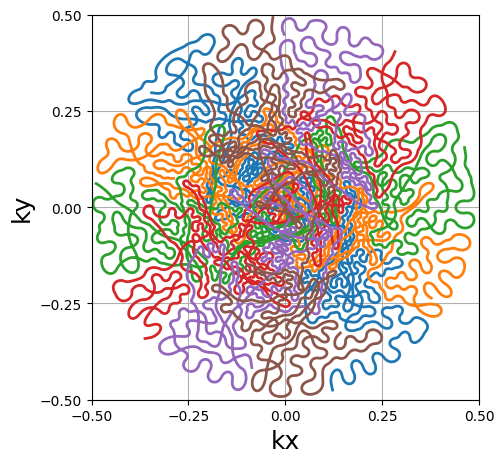

In [5]:
traj, params = read_trajectory("sparkling_2d")
traj *= 2   # The above trajectory is in [-0.25, 0.25] but we want it in [-0.5, 0.5]
display_2D_trajectory(traj)
traj = traj.astype(np.float32)

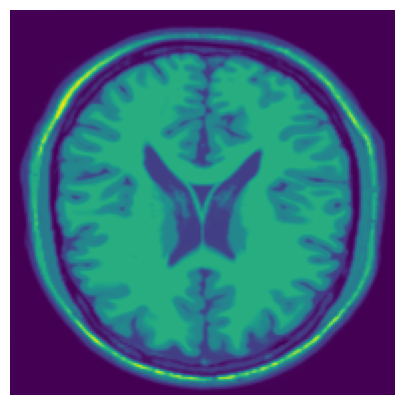

In [6]:
image = np.load('brainweb_2d_192.npy')

plt.figure(figsize=(5,5))
plt.imshow(image)
plt.axis(False)
plt.show()

/volatile/BL/fastmri/lib/python3.10/site-packages/mrinufft/_utils.py:87: UserWarning: Samples will be rescaled to [-pi, pi), assuming they were in [-0.5, 0.5)
  warnings.warn(


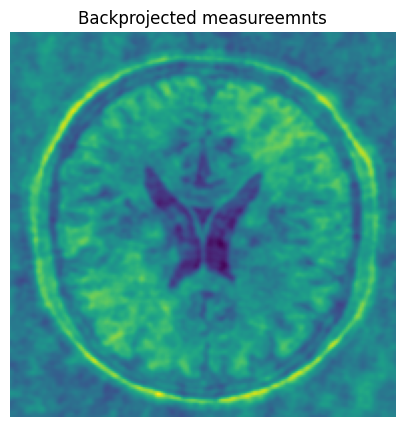

In [7]:
image_torch = torch.from_numpy(image).unsqueeze(0).unsqueeze(0)
x = image_torch.clone()
x = x/x.abs().max()

# Create a 2D Radial trajectory
samples_loc = traj.copy()

# Generate the physics
physics = Nufft(image_torch[0, 0].shape, samples_loc, density=None)
y = physics.A(x)
back = physics.A_adjoint(y)

plt.figure(figsize=(10, 5))
plt.imshow(torch.real(back).squeeze())
plt.axis(False)
plt.title('Backprojected measureemnts')
plt.show()

In [8]:
y.shape

torch.Size([1, 1, 16128])

## Reconstruction

In [24]:
path_save = '/volatile/BL/github_packages/fastMRI/fastmri_examples/unet/reconstructions/file_brain_AXFLAIR_200_6002425.h5'
path_folder = '/volatile/BL/github_packages/fastMRI/fastmri_examples/unet/reconstructions'

In [25]:
dataset_reconstruction = mri_data.SliceDataset(
    root=pathlib.Path(path_folder),
    transform=data_transform,
    challenge='singlecoil'
)

KeyError: "Unable to synchronously open object (object 'ismrmrd_header' doesn't exist)"